In [1]:
import importlib
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from src.data_transformation import transformation_pipeline

In [2]:
# Import ohlcv data as polar dataframe
ohlcv = pl.read_csv("data/raw/stocks/csv/ohlcv.csv").with_columns(
    pl.col("date").str.to_date("%Y-%m-%d")
)

In [3]:
# Apply transformations (~1 minute)
ohlcv = transformation_pipeline.transformation_pipeline(ohlcv)

Adjusting OHLCV data for stock splits...
Split data processed and cumulative factors calculated...


/Users/chinis/ds401-project/src/data_transformation/stock_adjustments.py:104: UserWarning: left key of asof join is not sorted.

This can lead to invalid results. Ensure the asof key is sorted
  ohlcv.sort(["act_symbol", "date"])
/Users/chinis/ds401-project/src/data_transformation/stock_adjustments.py:104: UserWarning: right key of asof join is not sorted.

This can lead to invalid results. Ensure the asof key is sorted
  ohlcv.sort(["act_symbol", "date"])


Filtering tickers present on first and last dates, with no nulls in-between...
First date: 2011-01-03
Last date: 2025-02-07
Removed 13432 tickers due to null values
Calculating technical indicators...
Technical indicators added!
Joining CBOE indices to stocks DataFrame...
CBOE indices joined successfully!


In [4]:
# Verify columns appended properly
print("Columns after transformation:", ohlcv.columns)
ohlcv.head(10)

Columns after transformation: ['act_symbol', 'date', 'open', 'high', 'low', 'close', 'volume', 'log_returns', 'OBV', 'vol_macd_line', 'vol_signal_line', 'vol_macd_hist', 'vol_12', 'vol_26', 'SMA_10', 'EMA_10', 'STD_10', 'SMA_EMA_ratio_10', 'RSI_10', 'ATR_10', 'CMF_10', 'CCI_10', 'DonchianRange_10', 'OBV_change_10', 'VWAP_10', 'VWAP_deviation_10', 'Skewness_10', 'Kurtosis_10', 'QuantileSpread_10_Extreme', 'QuantileSpread_10_IQR', 'YZVol_10', 'YZVol_10_future', 'ParkinsonVol_10', 'SMA_30', 'EMA_30', 'STD_30', 'SMA_EMA_ratio_30', 'RSI_30', 'ATR_30', 'CMF_30', 'CCI_30', 'DonchianRange_30', 'OBV_change_30', 'VWAP_30', 'VWAP_deviation_30', 'Skewness_30', 'Kurtosis_30', 'QuantileSpread_30_Extreme', 'QuantileSpread_30_IQR', 'YZVol_30', 'YZVol_30_future', 'ParkinsonVol_30', 'SMA_90', 'EMA_90', 'STD_90', 'SMA_EMA_ratio_90', 'RSI_90', 'ATR_90', 'CMF_90', 'CCI_90', 'DonchianRange_90', 'OBV_change_90', 'VWAP_90', 'VWAP_deviation_90', 'Skewness_90', 'Kurtosis_90', 'QuantileSpread_90_Extreme', 'Quant

act_symbol,date,open,high,low,close,volume,log_returns,OBV,vol_macd_line,vol_signal_line,vol_macd_hist,vol_12,vol_26,SMA_10,EMA_10,STD_10,SMA_EMA_ratio_10,RSI_10,ATR_10,CMF_10,CCI_10,DonchianRange_10,OBV_change_10,VWAP_10,VWAP_deviation_10,Skewness_10,Kurtosis_10,QuantileSpread_10_Extreme,QuantileSpread_10_IQR,YZVol_10,YZVol_10_future,ParkinsonVol_10,SMA_30,EMA_30,STD_30,SMA_EMA_ratio_30,…,OBV_change_30,VWAP_30,VWAP_deviation_30,Skewness_30,Kurtosis_30,QuantileSpread_30_Extreme,QuantileSpread_30_IQR,YZVol_30,YZVol_30_future,ParkinsonVol_30,SMA_90,EMA_90,STD_90,SMA_EMA_ratio_90,RSI_90,ATR_90,CMF_90,CCI_90,DonchianRange_90,OBV_change_90,VWAP_90,VWAP_deviation_90,Skewness_90,Kurtosis_90,QuantileSpread_90_Extreme,QuantileSpread_90_IQR,YZVol_90,YZVol_90_future,ParkinsonVol_90,vxazn,ovx,vxeem,gvz,vvix,vix9d,vix,vxapl
str,date,f64,f64,f64,f64,i64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""A""",2011-01-03,41.56,42.14,41.41,41.88,3572300,null,0,null,null,null,null,null,null,41.88,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.012969,null,null,41.88,null,null,…,null,null,null,null,null,null,null,null,0.024224,null,null,41.88,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.024754,null,null,28.21,null,18.95,84.8,null,17.61,null
"""AACG""",2011-01-03,3.67,3.76,3.67,3.7,2400,null,0,null,null,null,null,null,null,3.7,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.031913,null,null,3.7,null,null,…,null,null,null,null,null,null,null,null,0.030254,null,null,3.7,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.050917,null,null,28.21,null,18.95,84.8,null,17.61,null
"""AADR""",2011-01-03,29.98,30.06,29.88,30.06,1581,null,0,null,null,null,null,null,null,30.06,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.008088,null,null,30.06,null,null,…,null,null,null,null,null,null,null,null,0.011109,null,null,30.06,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.013187,null,null,28.21,null,18.95,84.8,null,17.61,null
"""AAME""",2011-01-03,2.06,2.06,2.06,2.06,1400,null,0,null,null,null,null,null,null,2.06,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.060791,null,null,2.06,null,null,…,null,null,null,null,null,null,null,null,0.043514,null,null,2.06,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.035459,null,null,28.21,null,18.95,84.8,null,17.61,null
"""AAON""",2011-01-03,12.69,12.92,12.68,12.89,231833,null,0,null,null,null,null,null,null,12.89,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.021539,null,null,12.89,null,null,…,null,null,null,null,null,null,null,null,0.026665,null,null,12.89,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.022588,null,null,28.21,null,18.95,84.8,null,17.61,null
"""AAP""",2011-01-03,66.5,66.74,65.47,65.5,826328,null,0,null,null,null,null,null,null,65.5,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.025627,null,null,65.5,null,null,…,null,null,null,null,null,null,null,null,0.0193,null,null,65.5,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.016156,null,null,28.21,null,18.95,84.8,null,17.61,null
"""AAPL""",2011-01-03,11.64,11.8,11.6,11.77,445121628,null,0,null,null,null,null,null,null,11.77,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.023161,null,null,11.77,null,null,…,null,null,null,null,null,null,null,null,0.018779,null,null,11.77,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.018297,null,null,28.21,null,18.95,84.8,null,17.61,null
"""AAXJ""",2011-01-03,64.6,64.82,64.5,64.58,181660,null,0,null,null,null,nul

In [5]:
# import src.data_modeling.volatility_clustering as vc
# importlib.reload(vc)

# # Load your processed data
# df = ohlcv

# # Define features for clustering
# volatility_features = [
#     'log_returns',
#     'YZVol_10',
#     'YZVol_30',
#     'YZVol_90'
# ]

# # Step 1: Find optimal eps value
# _, distance_matrix, tickers = vc.multi_feature_temporal_clustering(
#     df, 
#     features=volatility_features,
#     return_distance_matrix=True
# )

# sorted_distances = vc.find_optimal_eps(distance_matrix, k=4)

# # Step 2: Perform clustering with optimal parameters
# ticker_clusters = vc.multi_feature_temporal_clustering(
#     df,
#     features=volatility_features,
#     eps=0.5,  # Use value from k-distance plot
#     min_samples=5
# )

# # Step 3: Visualize results
# vc.visualize_clusters(df, ticker_clusters, feature='YZVol_30')

# # Optional: Perform parameter sweep to find best parameters
# parameter_results = vc.parameter_sweep(
#     df,
#     features=volatility_features,
#     eps_values=[0.3, 0.5, 0.7, 1.0],
#     min_samples_values=[3, 5, 10]
# )


## Above is an implementation of a volatility clustering approach. It takes too long to compute, don't run this.

## Apple Example
Here, we are filtering our data so we are only looking at AAPL data from 2020.  
We will construct some simple plots.

In [6]:
aapl = ohlcv.filter(pl.col("act_symbol") == "AAPL").sort("date")

aapl = aapl.filter(pl.col("date") >= pl.date(2012, 1, 1))

aapl.head(10)

act_symbol,date,open,high,low,close,volume,log_returns,OBV,vol_macd_line,vol_signal_line,vol_macd_hist,vol_12,vol_26,SMA_10,EMA_10,STD_10,SMA_EMA_ratio_10,RSI_10,ATR_10,CMF_10,CCI_10,DonchianRange_10,OBV_change_10,VWAP_10,VWAP_deviation_10,Skewness_10,Kurtosis_10,QuantileSpread_10_Extreme,QuantileSpread_10_IQR,YZVol_10,YZVol_10_future,ParkinsonVol_10,SMA_30,EMA_30,STD_30,SMA_EMA_ratio_30,…,OBV_change_30,VWAP_30,VWAP_deviation_30,Skewness_30,Kurtosis_30,QuantileSpread_30_Extreme,QuantileSpread_30_IQR,YZVol_30,YZVol_30_future,ParkinsonVol_30,SMA_90,EMA_90,STD_90,SMA_EMA_ratio_90,RSI_90,ATR_90,CMF_90,CCI_90,DonchianRange_90,OBV_change_90,VWAP_90,VWAP_deviation_90,Skewness_90,Kurtosis_90,QuantileSpread_90_Extreme,QuantileSpread_90_IQR,YZVol_90,YZVol_90_future,ParkinsonVol_90,vxazn,ovx,vxeem,gvz,vvix,vix9d,vix,vxapl
str,date,f64,f64,f64,f64,i64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""AAPL""",2012-01-03,14.63,14.73,14.61,14.69,302258796,0.015781,-2043038032,-0.001849,-0.00167,-0.000179,0.011301,0.01315,14.31,14.337224,0.287325,0.998101,89.130435,0.215,0.696778,77.694486,1.14,1682859248,14.285767,0.404233,2.237033,3.745557,0.032139,0.009188,0.013822,0.009063,0.025399,13.863333,14.06687,0.44834,0.985531,…,1291445708,13.808968,0.881032,1.294231,1.054716,0.048947,0.014965,0.01734,0.02162,0.051816,13.988556,13.837214,0.463852,1.010937,53.781004,0.326556,0.506282,66.715508,2.59,-2321840360,13.993706,0.696294,-0.071018,0.899488,0.055609,0.020679,0.022185,0.025363,0.131466,46.12,40.07,32.73,22.9,91.39,20.63,22.97,33.29
"""AAPL""",2012-01-04,14.65,14.81,14.62,14.77,260244432,0.005431,-1782793600,-0.001973,-0.001731,-0.000242,0.010848,0.012821,14.422,14.415911,0.209115,1.000422,89.43662,0.219,0.734017,64.442326,0.98,1707576024,14.390273,0.379727,2.272167,3.931355,0.032139,0.008689,0.013812,0.009162,0.025725,13.909333,14.112233,0.468445,0.985622,…,1923765200,13.848179,0.921821,1.328536,1.1781,0.048947,0.014046,0.01718,0.021923,0.051776,14.004333,13.857715,0.466033,1.01058,54.297821,0.324222,0.501272,70.514898,2.59,-1190295624,14.012938,0.757062,-0.069934,0.911462,0.055609,0.020679,0.021974,0.025458,0.130618,45.94,39.04,31.79,22.08,88.89,19.32,22.22,31.09
"""AAPL""",2012-01-05,14.82,14.95,14.74,14.93,271267220,0.010775,-1511526380,-0.000563,-0.001497,0.000934,0.010882,0.011445,14.501,14.509381,0.237975,0.999422,86.238532,0.19,0.720644,71.245901,0.95,1641440332,14.491636,0.438364,-0.271348,-1.276469,0.019663,0.007863,0.008992,0.011261,0.023351,13.967667,14.164992,0.48322,0.986069,…,2643234776,13.910174,1.019826,1.488974,1.660688,0.046318,0.015047,0.016508,0.021956,0.051669,14.018,13.881282,0.474958,1.009849,53.766075,0.321333,0.496649,82.678264,2.59,-1560503448,14.025394,0.904606,-0.104253,1.025059,0.055609,0.02019,0.021741,0.025484,0.129207,44.7,38.7,31.13,22.34,87.69,18.25,21.48,30.55
"""AAPL""",2012-01-06,14.99,15.1,14.97,15.09,318385648,0.01066,-1193140732,-0.000463,-0.00129,0.000827,0.010801,0.011264,14.594,14.614948,0.269535,0.998567,87.804878,0.188,0.733576,81.767956,0.95,1696879268,14.601985,0.488015,-0.248156,-1.282596,0.019663,0.00569,0.008944,0.01177,0.02251,14.022333,14.22467,0.514397,0.985776,…,2552323060,13.971938,1.118062,1.437071,1.811314,0.046318,0.014961,0.016274,0.022251,0.050702,14.030889,13.907847,0.4881,1.008847,53.567036,0.320111,0.499018,99.242179,2.59,-1647370396,14.03407,1.05593,-0.111632,1.067144,0.055609,0.019991,0.02159,0.025555,0.129207,44.6,37.12,31.51,21.3,86.95,17.01,20.63,30.07
"""AAPL""",2012-01-09,15.2,15.28,15.05,15.06,394023168,-0.00199,-1587163900,-0.003571,-0.001746,-0.001824,0.007075,0.010645,14.677,14.695867,0.272766,0.998716,84.87395,0.201,0.628116,76.4265,1.01,1100499652,14.70819,0.35181,-0.309508,-1.567779,0.020248,0.009907,0.009458,0.013172,0.023912,14.087333,14.278562,0.

In [7]:
aapl_date = aapl['date'].to_list()
aapl_close = aapl['close'].to_list()
aapl_volume = aapl['volume'].to_list()
aapl_log_returns = aapl['log_returns'].to_list()
aapl_sma_30 = aapl['SMA_30'].to_list()
aapl_ema_30 = aapl['EMA_30'].to_list()
aapl_std_30 = aapl['STD_30'].to_list()
aapl_rmi_30 = aapl['RSI_30'].to_list()
aapl_macd = aapl['vol_macd_line'].to_list()
aapl_signal_line = aapl['vol_signal_line'].to_list()
aapl_macd_histogram = aapl['vol_macd_hist'].to_list()
aapl_donchian_30 = aapl['DonchianRange_30'].to_list()
aapl_parkinson_10 = aapl['ParkinsonVol_10'].to_list()
aapl_parkinson_30 = aapl['ParkinsonVol_30'].to_list()
aapl_parkinson_90 = aapl['ParkinsonVol_90'].to_list()
aapl_yz_10 = aapl['YZVol_10'].to_list()
aapl_yz_30 = aapl['YZVol_30'].to_list()
aapl_yz_90 = aapl['YZVol_90'].to_list()
aapl_vix = aapl['vix'].to_list()
aapl_vxapl = aapl['vxapl'].to_list()

# Create BB_upper and BB_lower
aapl_bb_upper_30 = [sma + 2 * std for sma, std in zip(aapl_sma_30, aapl_std_30)]
aapl_bb_lower_30 = [sma - 2 * std for sma, std in zip(aapl_sma_30, aapl_std_30)]

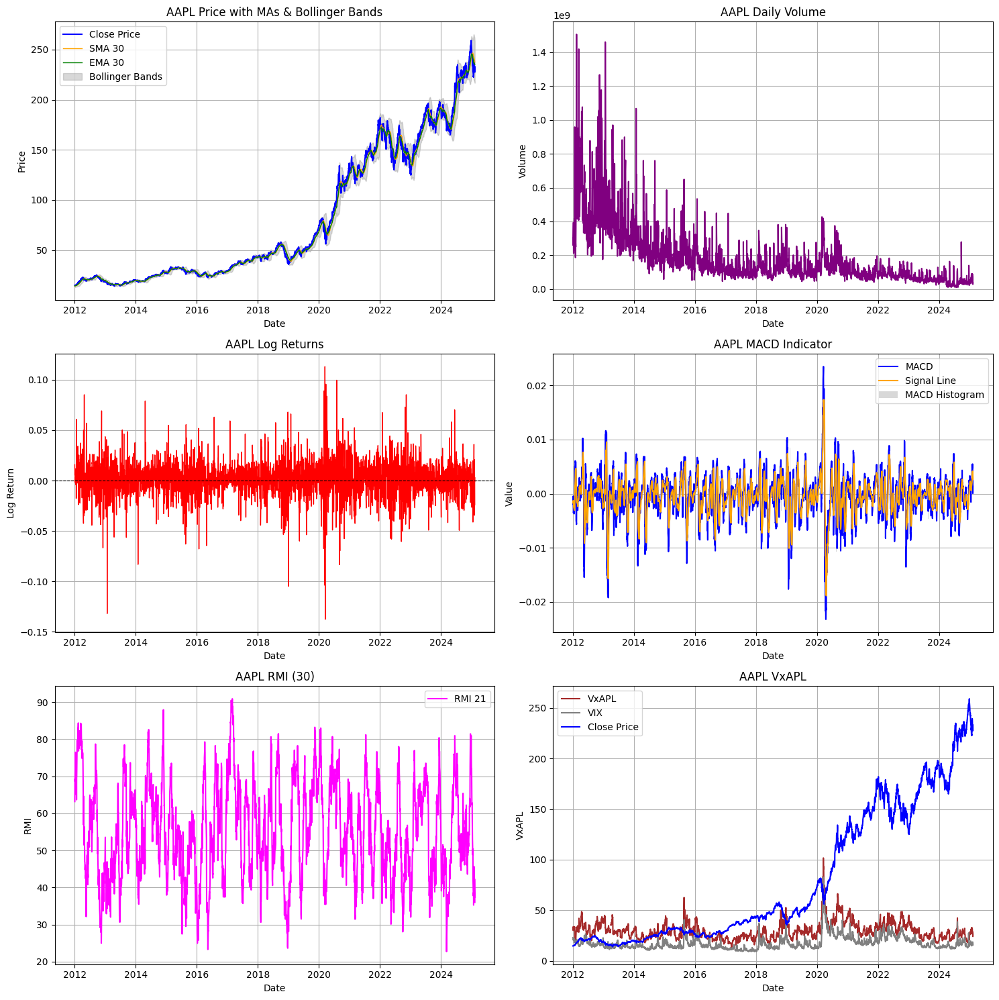

In [8]:
# Create a figure with 6 subplots (3 rows, 2 columns)
fig, axes = plt.subplots(3, 2, figsize=(15, 15))

# Plot 1: Close Price with SMA, EMA, and Bollinger Bands
ax = axes[0, 0]
ax.plot(aapl_date, aapl_close, label='Close Price', color='blue', linewidth=1.5)
ax.plot(aapl_date, aapl_sma_30, label='SMA 30', color='orange', linewidth=1)
ax.plot(aapl_date, aapl_ema_30, label='EMA 30', color='green', linewidth=1)
ax.fill_between(aapl_date, aapl_bb_lower_30, aapl_bb_upper_30, color='grey', alpha=0.3, label='Bollinger Bands')
ax.set_title("AAPL Price with MAs & Bollinger Bands")
ax.set_xlabel("Date")
ax.set_ylabel("Price")
ax.legend()
ax.grid(True)

# Plot 2: Daily Volume
ax = axes[0, 1]
ax.plot(aapl_date, aapl_volume, color='purple')
ax.set_title("AAPL Daily Volume")
ax.set_xlabel("Date")
ax.set_ylabel("Volume")
ax.grid(True)

# Plot 3: Log Returns
ax = axes[1, 0]
ax.plot(aapl_date, aapl_log_returns, color='red', linewidth=1)
ax.axhline(0, color='black', linestyle='--', linewidth=0.8)
ax.set_title("AAPL Log Returns")
ax.set_xlabel("Date")
ax.set_ylabel("Log Return")
ax.grid(True)

# Plot 4: MACD and Signal Line
ax = axes[1, 1]
ax.plot(aapl_date, aapl_macd, label='MACD', color='blue', linewidth=1.5)
ax.plot(aapl_date, aapl_signal_line, label='Signal Line', color='orange', linewidth=1.5)
ax.bar(aapl_date, aapl_macd_histogram, label='MACD Histogram', color='grey', alpha=0.3)
ax.set_title("AAPL MACD Indicator")
ax.set_xlabel("Date")
ax.set_ylabel("Value")
ax.legend()
ax.grid(True)

# Plot 5: RMI (Relative Momentum Index)
ax = axes[2, 0]
ax.plot(aapl_date, aapl_rmi_30, label='RMI 21', color='magenta', linewidth=1.5)
ax.set_title("AAPL RMI (30)")
ax.set_xlabel("Date")
ax.set_ylabel("RMI")
ax.legend()
ax.grid(True)

# Plot 6: VxAPL (Volatility Indicator)
ax = axes[2, 1]
ax.plot(aapl_date, aapl_vxapl, label='VxAPL', color='brown', linewidth=1.5)
ax.plot(aapl_date, aapl_vix, label='VIX', color='grey', linewidth=1.5)
ax.plot(aapl_date, aapl_close, label='Close Price', color='blue', linewidth=1.5)
ax.set_title("AAPL VxAPL")
ax.set_xlabel("Date")
ax.set_ylabel("VxAPL")
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()


In [9]:
volatility_history = pl.read_csv("data/raw/options/csv/volatility_history.csv")

# Adjust date column format
volatility_history = volatility_history.with_columns(
    pl.col("date").str.to_date("%Y-%m-%d")
)

# Filter to only include AAPL
volatility_history = volatility_history.filter(pl.col("act_symbol") == "AAPL").filter(pl.col("date") >= pl.date(2012, 1, 1))

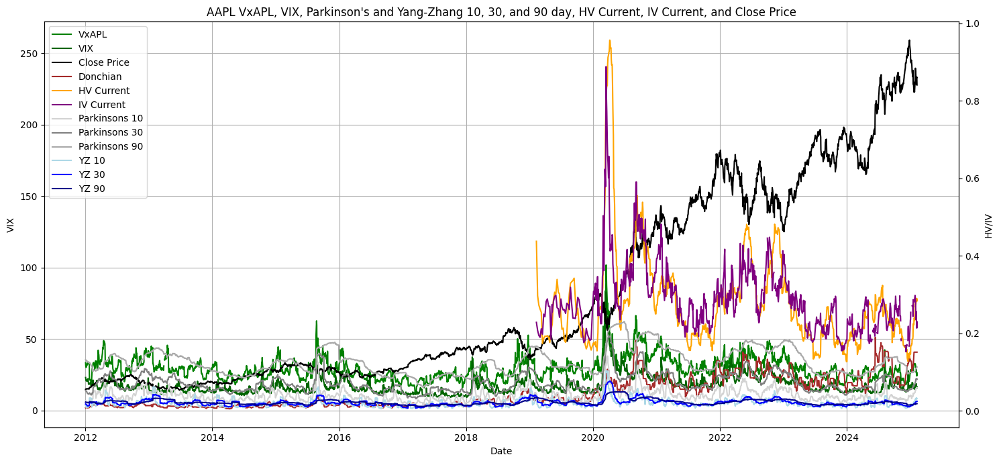

In [10]:
fig, ax = plt.subplots(figsize=(15, 7))

ax.plot(aapl_date, aapl_vxapl, label='VxAPL', color='green', linewidth=1.5)
ax.plot(aapl_date, aapl_vix, label='VIX', color='darkgreen', linewidth=1.5)
ax.plot(aapl_date, aapl_close, label='Close Price', color='black', linewidth=1.5)
ax.plot(aapl_date, aapl_donchian_30, label='Donchian', color='brown', linewidth=1.5)


# Create a secondary y-axis for the HV and IV data
ax2 = ax.twinx()

# Extract hv_current and iv_current
hv = np.array(volatility_history['hv_current'].to_list())
iv = np.array(volatility_history['iv_current'].to_list())

# Get the corresponding dates for volatility_history
vol_dates = volatility_history['date'].to_list()

# Plot the HV and IV on the secondary axis
ax2.plot(vol_dates, hv, label='HV Current', color='orange', linewidth=1.5)
ax2.plot(vol_dates, iv, label='IV Current', color='purple', linewidth=1.5)
ax2.plot(aapl_date, aapl_parkinson_10, label='Parkinsons 10', color='lightgrey', linewidth=1.5)
ax2.plot(aapl_date, aapl_parkinson_30, label='Parkinsons 30', color='grey', linewidth=1.5)
ax2.plot(aapl_date, aapl_parkinson_90, label='Parkinsons 90', color='darkgrey', linewidth=1.5)
ax2.plot(aapl_date, aapl_yz_10, label='YZ 10', color='lightblue', linewidth=1.5)
ax2.plot(aapl_date, aapl_yz_30, label='YZ 30', color='blue', linewidth=1.5)
ax2.plot(aapl_date, aapl_yz_90, label='YZ 90', color='darkblue', linewidth=1.5)
ax2.set_ylabel("HV/IV")

# Combine legends from both axes
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax.legend(lines + lines2, labels + labels2, loc='upper left')

ax.set_title("AAPL VxAPL, VIX, Parkinson's and Yang-Zhang 10, 30, and 90 day, HV Current, IV Current, and Close Price")
ax.set_xlabel("Date")
ax.set_ylabel("VIX")
ax.grid(True)
plt.tight_layout()
plt.show()


Indicator groups by window:
Window 10: ['open', 'high', 'low', 'close', 'volume', 'log_returns', 'OBV', 'vol_macd_line', 'vol_signal_line', 'vol_macd_hist', 'vol_12', 'vol_26', 'SMA_10', 'EMA_10', 'STD_10', 'SMA_EMA_ratio_10', 'RSI_10', 'ATR_10', 'CMF_10', 'CCI_10', 'DonchianRange_10', 'OBV_change_10', 'VWAP_10', 'VWAP_deviation_10', 'Skewness_10', 'Kurtosis_10', 'QuantileSpread_10_Extreme', 'QuantileSpread_10_IQR', 'YZVol_10', 'YZVol_10_future', 'ParkinsonVol_10', 'vxazn', 'ovx', 'vxeem', 'gvz', 'vvix', 'vix9d', 'vix', 'vxapl']
Window 30: ['open', 'high', 'low', 'close', 'volume', 'log_returns', 'OBV', 'vol_macd_line', 'vol_signal_line', 'vol_macd_hist', 'vol_12', 'vol_26', 'SMA_30', 'EMA_30', 'STD_30', 'SMA_EMA_ratio_30', 'RSI_30', 'ATR_30', 'CMF_30', 'CCI_30', 'DonchianRange_30', 'OBV_change_30', 'VWAP_30', 'VWAP_deviation_30', 'Skewness_30', 'Kurtosis_30', 'QuantileSpread_30_Extreme', 'QuantileSpread_30_IQR', 'YZVol_30', 'YZVol_30_future', 'ParkinsonVol_30', 'vxazn', 'ovx', 'vxeem'

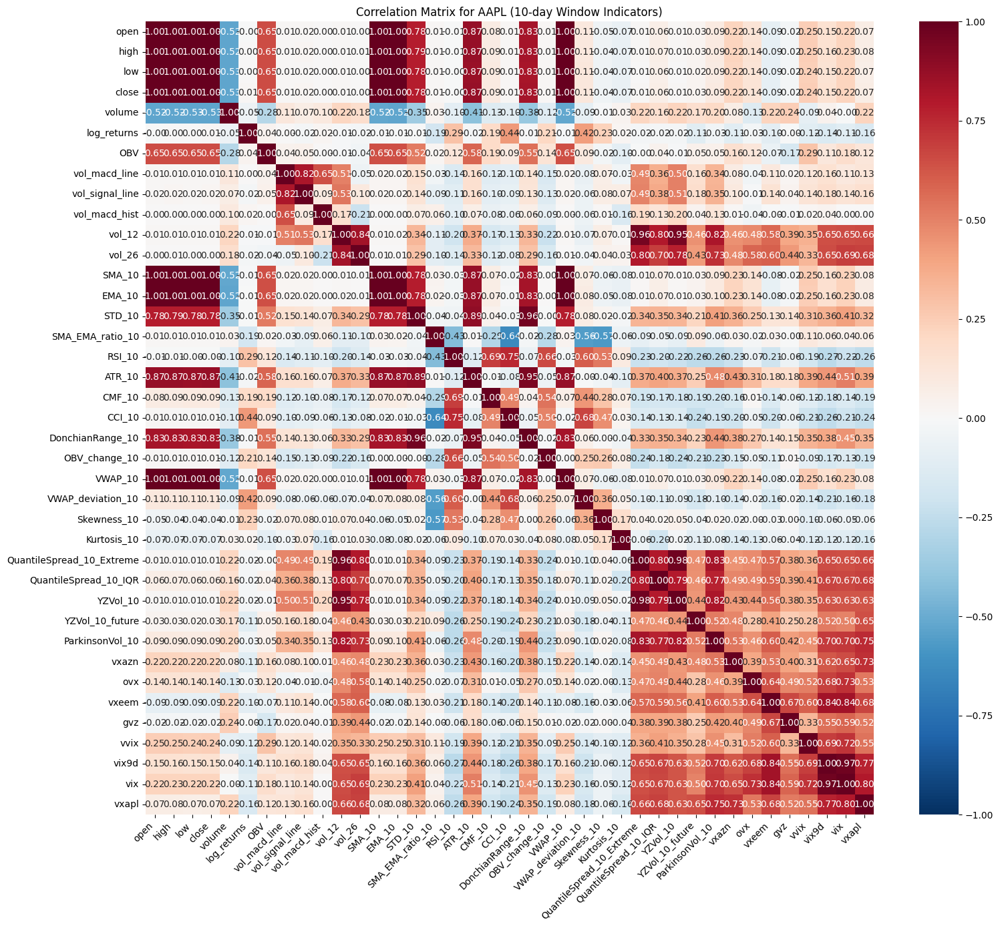


Top 15 correlated pairs for window 10:
SMA_10 <-> VWAP_10: 1.0000
SMA_10 <-> EMA_10: 0.9999
EMA_10 <-> VWAP_10: 0.9999
open <-> high: 0.9999
low <-> close: 0.9999
high <-> close: 0.9999
open <-> low: 0.9999
high <-> low: 0.9999
open <-> close: 0.9998
high <-> EMA_10: 0.9995
open <-> EMA_10: 0.9994
close <-> EMA_10: 0.9993
low <-> EMA_10: 0.9993
open <-> VWAP_10: 0.9992
high <-> VWAP_10: 0.9992


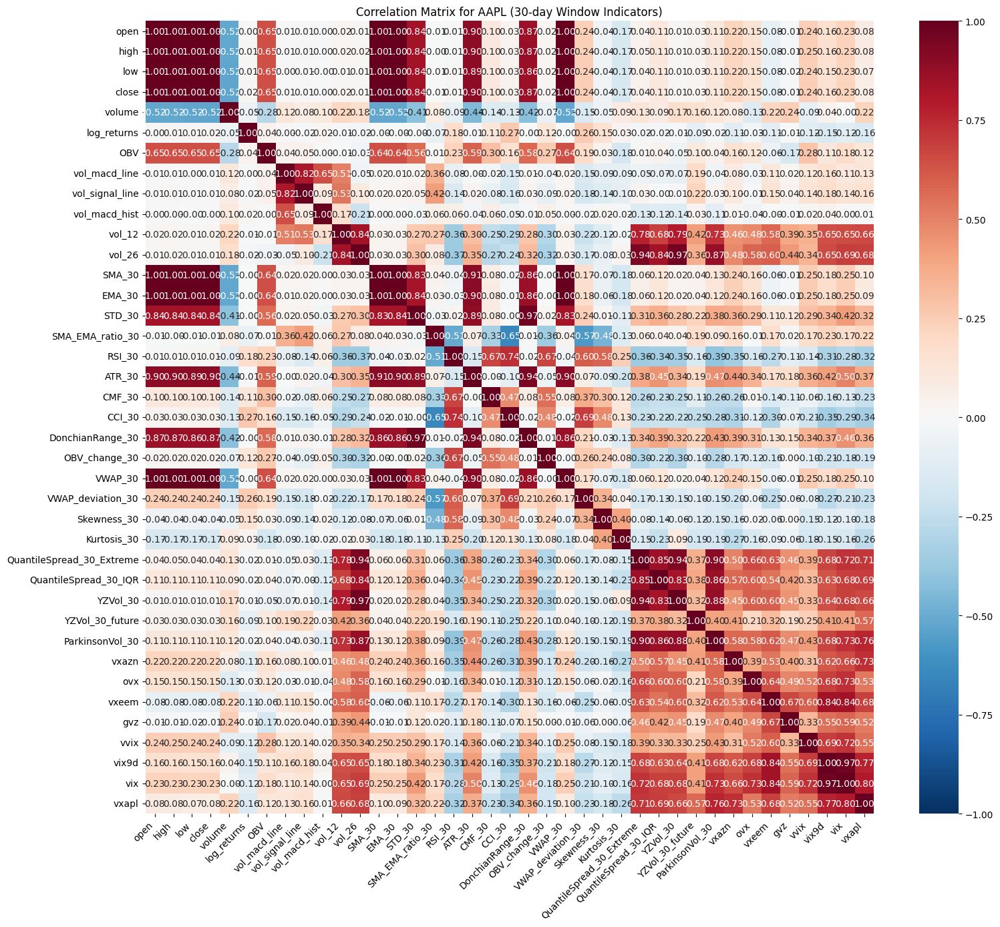


Top 15 correlated pairs for window 30:
SMA_30 <-> VWAP_30: 1.0000
open <-> high: 0.9999
high <-> close: 0.9999
open <-> low: 0.9999
low <-> close: 0.9999
high <-> low: 0.9999
EMA_30 <-> VWAP_30: 0.9999
SMA_30 <-> EMA_30: 0.9998
open <-> close: 0.9998
high <-> EMA_30: 0.9980
open <-> EMA_30: 0.9980
close <-> EMA_30: 0.9979
low <-> EMA_30: 0.9978
high <-> VWAP_30: 0.9974
open <-> VWAP_30: 0.9973


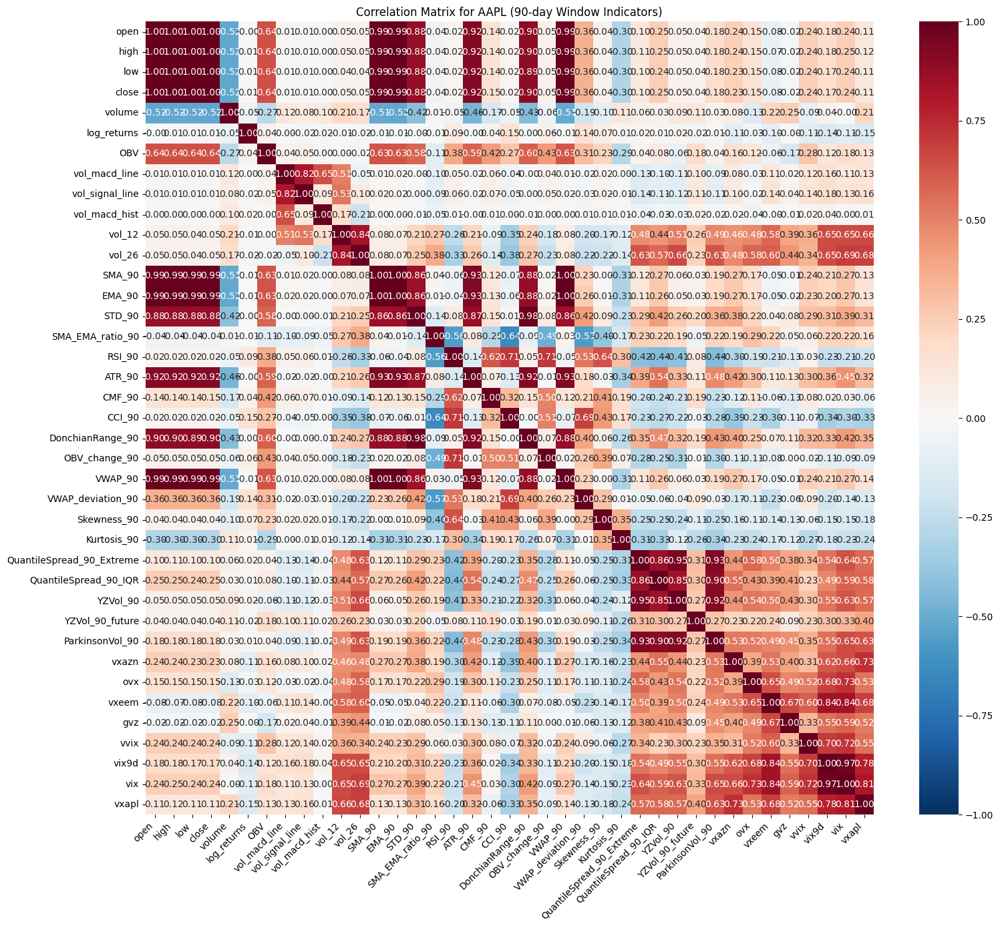


Top 15 correlated pairs for window 90:
SMA_90 <-> VWAP_90: 0.9999
open <-> high: 0.9999
high <-> close: 0.9999
open <-> low: 0.9999
low <-> close: 0.9999
high <-> low: 0.9998
open <-> close: 0.9998
SMA_90 <-> EMA_90: 0.9995
EMA_90 <-> VWAP_90: 0.9994
high <-> EMA_90: 0.9942
open <-> EMA_90: 0.9940
close <-> EMA_90: 0.9940
low <-> EMA_90: 0.9939
high <-> VWAP_90: 0.9916
high <-> SMA_90: 0.9915


In [11]:
# Define the window suffixes to check
windows = [10, 30, 90]
window_groups = {}

for w in windows:
    # Exclude indicators containing other window suffixes
    excluded_windows = [f"_{other_w}" for other_w in windows if other_w != w]
    
    window_groups[w] = [
        col for col in aapl.columns
        if not any(excl in col for excl in excluded_windows) 
        and not col.startswith("date") 
        and not col.startswith("act_symbol")
    ]

print("Indicator groups by window:")
for w in windows:
    print(f"Window {w}: {window_groups[w]}")

stock_symbol = aapl['act_symbol'][0]

# Compute the correlation matrix and plot the heatmap.
for w in windows:
    indicators = window_groups[w]
    if len(indicators) == 0:
        continue  # Skip if no indicators for this window.
    
    stock_data_group = aapl.drop_nulls(indicators)
    if stock_data_group.height == 0:
        print(f"No sufficient data for window {w} indicators.")
        continue

    # Compute correlation matrix (Polars returns a DataFrame; convert to NumPy for plotting)
    corr_matrix = stock_data_group.select(indicators).corr().to_numpy()

    plt.figure(figsize=(16, 14))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='RdBu_r',
                xticklabels=indicators, yticklabels=indicators,
                vmin=-1, vmax=1)
    plt.title(f"Correlation Matrix for {stock_symbol} ({w}-day Window Indicators)")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Optionally, print the top 15 most correlated indicator pairs for this window.
    pairs = []
    for i in range(len(indicators)):
        for j in range(i + 1, len(indicators)):
            pairs.append((indicators[i], indicators[j], corr_matrix[i, j]))
    pairs.sort(key=lambda x: abs(x[2]), reverse=True)
    print(f"\nTop 15 correlated pairs for window {w}:")
    for feat1, feat2, corr in pairs[:15]:
        print(f"{feat1} <-> {feat2}: {corr:.4f}")


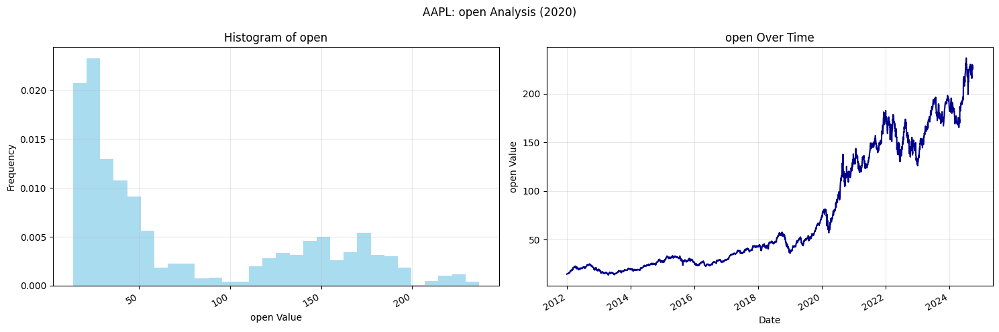

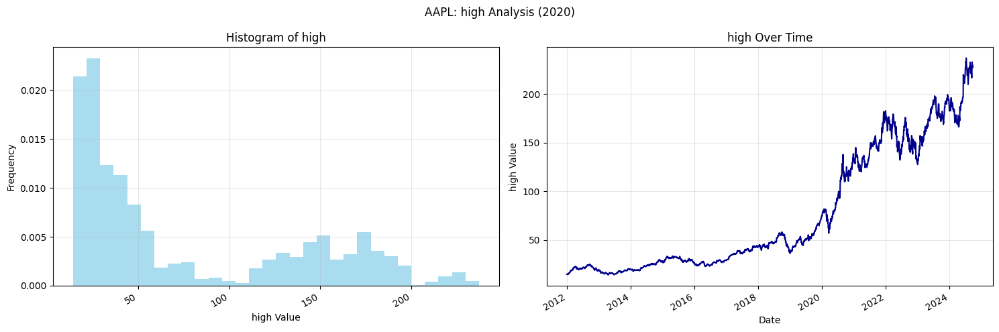

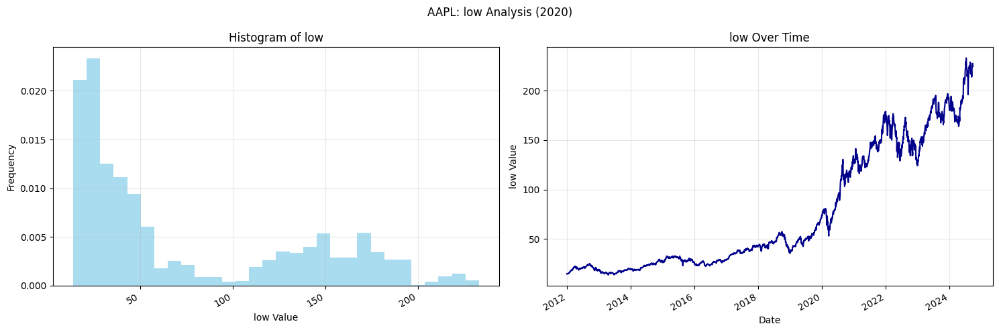

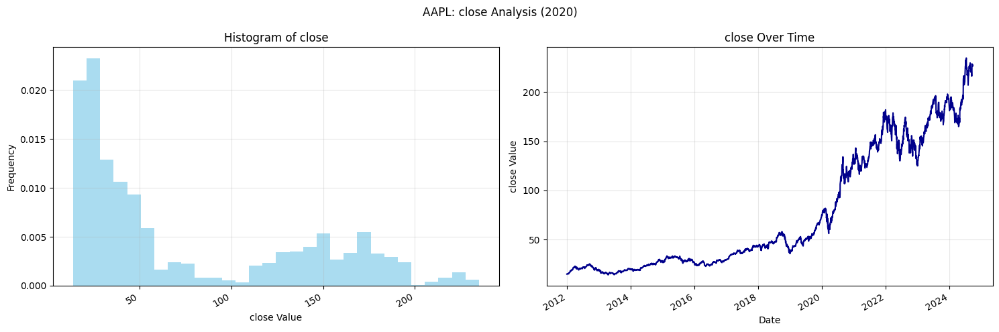

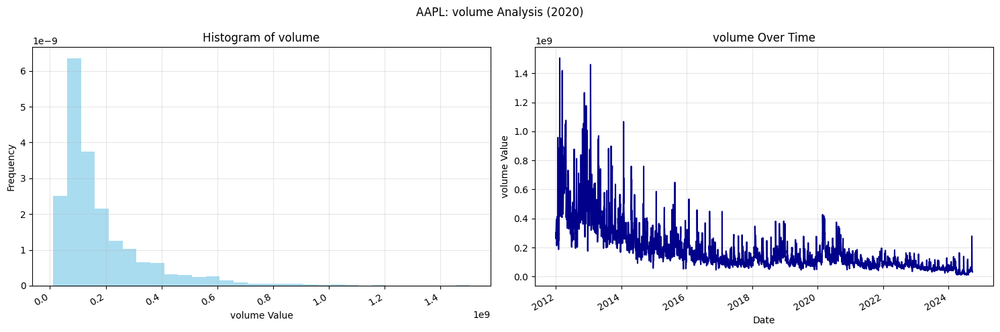

...

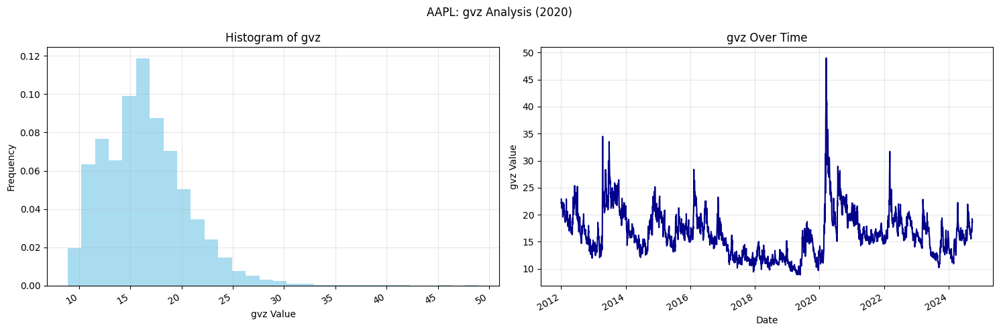

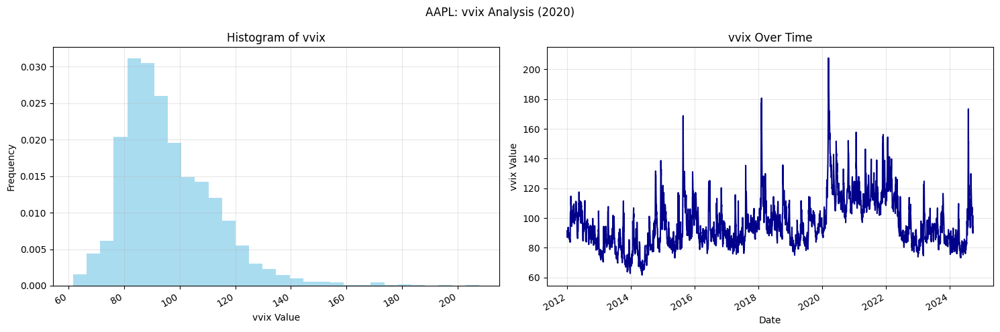

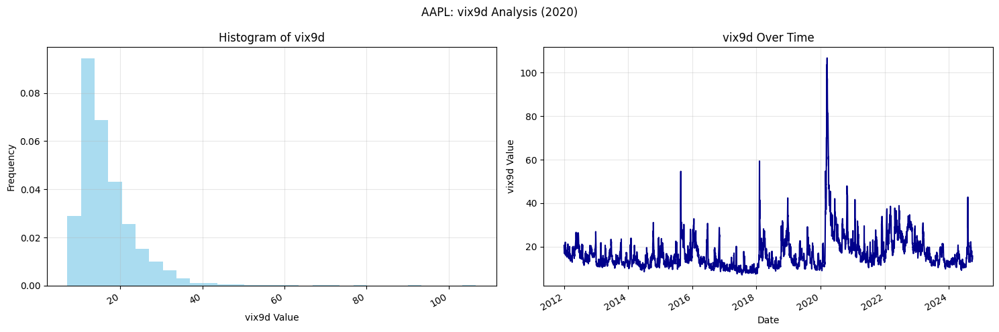

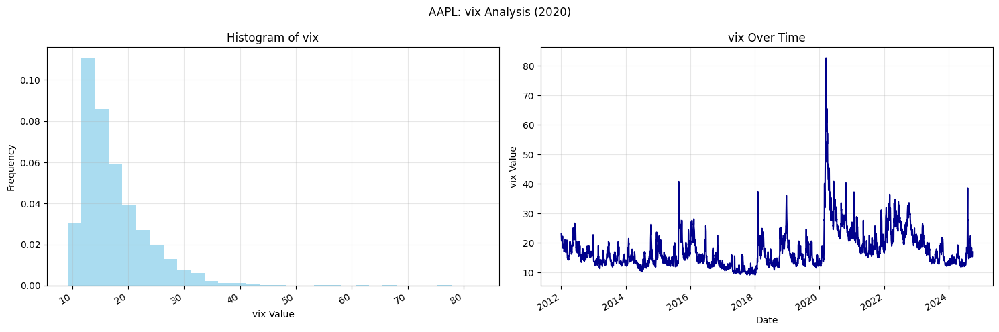

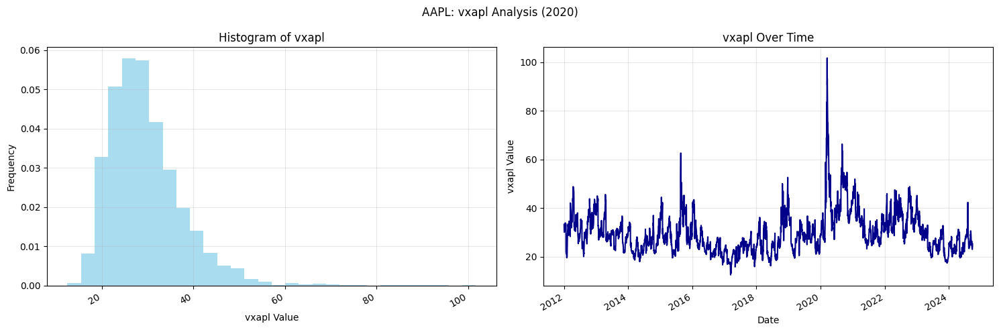

In [12]:
# Get actual column names that exist in the dataframe
indicators_to_plot = [col for col in aapl.columns
                      if not col.startswith("date") 
                      and not col.startswith("act_symbol")]

# Drop rows with null values in the selected columns
stock_data = aapl.drop_nulls(indicators_to_plot)

# Extract dates for time series plotting
dates = stock_data["date"].to_numpy()

# Loop over each indicator and produce histogram and time series plot
for col in indicators_to_plot:
    # Convert the column to a NumPy array
    data_series = stock_data[col].to_numpy()
    
    # Create a figure with two subplots: histogram and time series
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Histogram: Plot the distribution
    axs[0].hist(data_series, bins=30, density=True, alpha=0.7, color='skyblue')
    axs[0].set_title(f"Histogram of {col}")
    axs[0].set_xlabel(f"{col} Value")
    axs[0].set_ylabel("Frequency")
    axs[0].grid(True, alpha=0.3)
    
    # Time Series: Plot the indicator values over time
    axs[1].plot(dates, data_series, linewidth=1.5, color='darkblue')
    axs[1].set_title(f"{col} Over Time")
    axs[1].set_xlabel("Date")
    axs[1].set_ylabel(f"{col} Value")
    axs[1].grid(True, alpha=0.3)
    
    # Format the date axis for better readability
    fig.autofmt_xdate()
    
    plt.suptitle(f"{stock_symbol}: {col} Analysis (2020)")
    plt.tight_layout()
    plt.show()